In [3]:
!pip install datasets

   ---------------------------------------- 0.0/542.0 kB ? eta -:--:--
   ------------------------------- ------- 440.3/542.0 kB 13.9 MB/s eta 0:00:01
   --------------------------------------- 542.0/542.0 kB 11.6 MB/s eta 0:00:00
   ---------------------------------------- 0.0/116.3 kB ? eta -:--:--
   ---------------------------------------- 116.3/116.3 kB 6.6 MB/s eta 0:00:00
   ---------------------------------------- 0.0/25.9 MB ? eta -:--:--
    --------------------------------------- 0.4/25.9 MB 13.9 MB/s eta 0:00:02
   - -------------------------------------- 0.9/25.9 MB 11.8 MB/s eta 0:00:03
   -- ------------------------------------- 1.3/25.9 MB 11.9 MB/s eta 0:00:03
   -- ------------------------------------- 1.7/25.9 MB 10.0 MB/s eta 0:00:03
   -- ------------------------------------- 1.8/25.9 MB 9.6 MB/s eta 0:00:03
   --- ------------------------------------ 2.2/25.9 MB 8.7 MB/s eta 0:00:03
   --- ------------------------------------ 2.6/25.9 MB 8.2 MB/s eta 0:00:03
   --

In [4]:
from datasets import load_dataset

data = load_dataset('pinecone/image-set', split='train', revision='e7d39fc')

Generating train split: 0 examples [00:00, ? examples/s]

In [8]:
data

Dataset({
    features: ['image_bytes', 'image'],
    num_rows: 21
})

In [10]:
from base64 import b64decode
import cv2
import numpy as np

def process_fn(sample):
    image_bytes = b64decode(sample['image_bytes'])
    image = cv2.imdecode(
        np.frombuffer(image_bytes, np.uint8), cv2.IMREAD_COLOR
    )
    return image

images = [process_fn(sample) for sample in data]

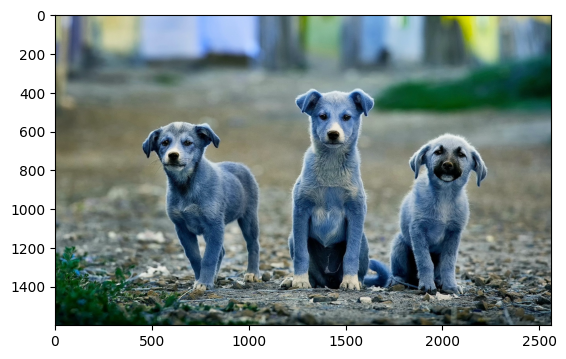

In [11]:
import matplotlib.pyplot as plt

plt.imshow(images[0])

In [12]:
shape = images[0].shape
shape, images[0][0,0,:]

((1600, 2560, 3), array([165, 174, 134], dtype=uint8))

In [13]:
import numpy as np

rgb_image = np.flip(images[0], 2)

shape = rgb_image.shape
shape, rgb_image[0,0,:]

((1600, 2560, 3), array([134, 174, 165], dtype=uint8))

In [14]:
images[0][0,0,:]

array([165, 174, 134], dtype=uint8)

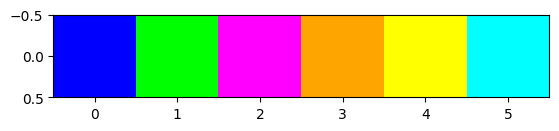

In [15]:
blue =[0,0,255]
green =[0,255,0]
red =[255,0,0]
violet =[255,0,255]
orange =[255,165,0]
yellow =[255,255,0]
cyan =[0,255,255]

colors = np.array([[blue,green,violet,orange,yellow,cyan]])

plt.imshow(colors)

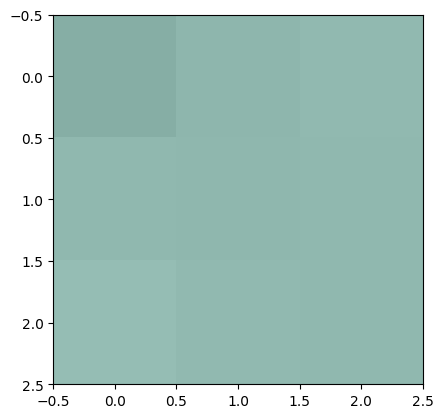

In [16]:
plt.imshow(rgb_image[:3,:3,:])

In [17]:
image_vector = rgb_image.reshape(1,-1,3)
image_vector.shape

(1, 4096000, 3)

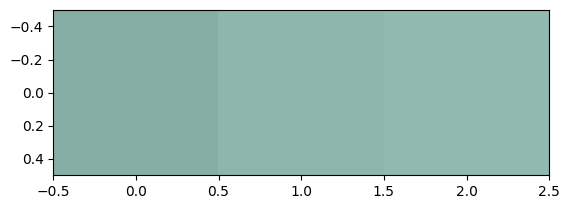

In [18]:
plt.imshow(image_vector[:,:3,:])

In [19]:
red=image_vector[0,:,0]
green=image_vector[0,:,1]
blue=image_vector[0,:,2]

red.shape, green.shape, blue.shape

((4096000,), (4096000,), (4096000,))

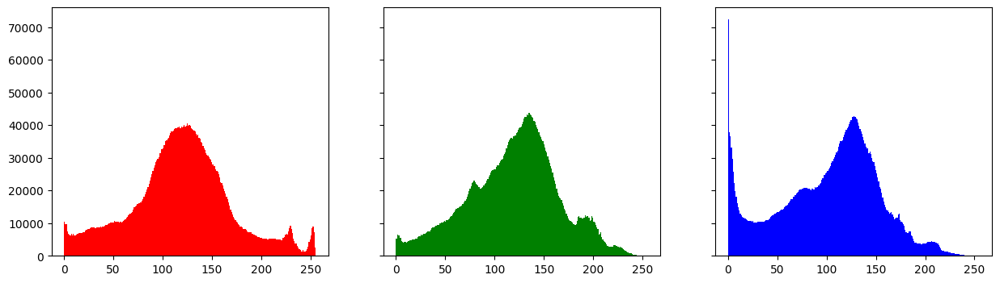

In [20]:
fig, axs = plt.subplots(1,3,figsize=(15,4),sharey=True)
axs[0].hist(red,bins=256,color='r')
axs[1].hist(green, bins=256, color='g')
axs[2].hist(blue, bins=256, color='b')
plt.show()

In [21]:
def build_histogram(image, bins=256):
    # convert from BGR to RGB
    rgb_image = np.flip(image, 2)
    
    # show the image
    plt.imshow(rgb_image)
    
    # convert to vector
    image_vector = rgb_image.reshape(1, -1, 3)
    
    # break into given number of bins
    div = 256 / bins
    bins_vector = (image_vector/div).astype(int)
    
    # get the red, green, and blue channels
    red = bins_vector[0,:,0]
    green = bins_vector[0,:,1]
    blue = bins_vector[0,:,2]
    
    # build the histograms
    fig, axs = plt.subplots(1,3,figsize=(15,4),sharey=True)
    axs[0].hist(red,bins=256,color='r')
    axs[1].hist(green, bins=256, color='g')
    axs[2].hist(blue, bins=256, color='b')
    plt.show()

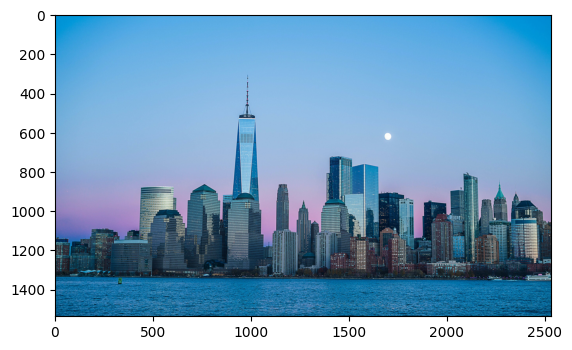

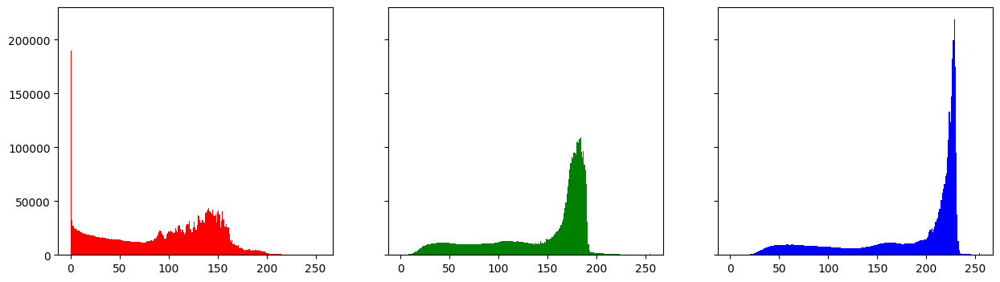

In [22]:
build_histogram(images[1])

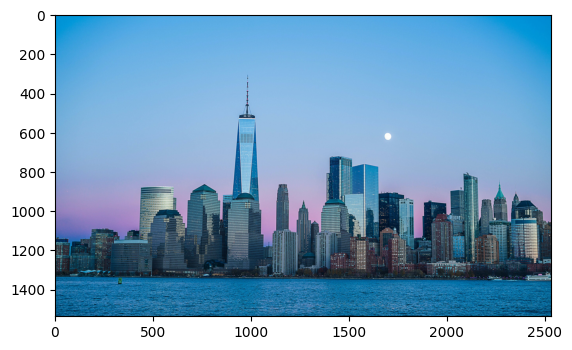

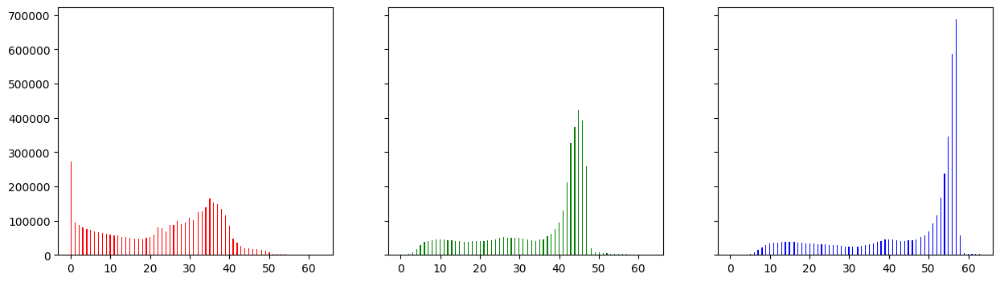

In [23]:
build_histogram(images[1],64)

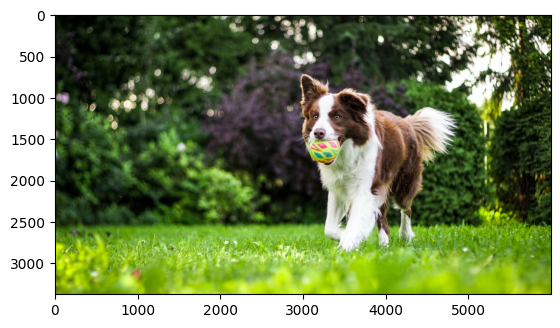

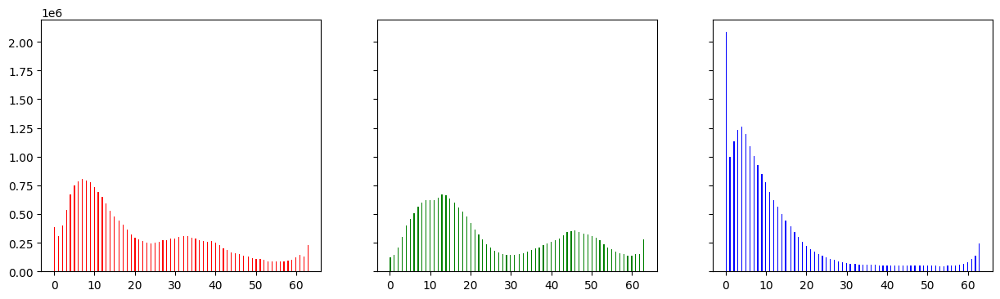

In [24]:
build_histogram(images[2],64)

In [25]:
red_hist = cv2.calcHist([images[5]],[2],None,[64],[0, 256])
green_hist = cv2.calcHist([images[5]],[1],None,[64],[0, 256])
blue_hist = cv2.calcHist([images[5]],[0],None,[64],[0, 256])

red_hist.shape

(64, 1)

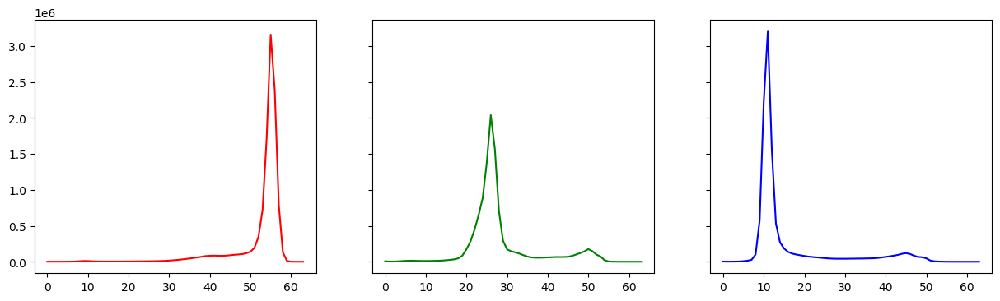

In [26]:
fig, axs = plt.subplots(1,3, figsize=(15,4), sharey=True)
axs[0].plot(red_hist, color='r')
axs[1].plot(green_hist, color='g')
axs[2].plot(blue_hist, color='b')
plt.show()

In [42]:
# def get_vector(image, bins=32):
#     red = cv2.calcHist([images[5]],[2],None,[64],[0, 256])
#     green = cv2.calcHist([images[5]],[1],None,[64],[0, 256])
#     blue = cv2.calcHist([images[5]],[0],None,[64],[0, 256])
#     vector = np.concatenate([red, green, blue], axis = 0)
#     vector = vector.reshape(-1)
#     return vector


def get_vector(image, bins=32):
    red = cv2.calcHist([image], [2], None, [bins], [0, 256])
    green = cv2.calcHist([image], [1], None, [bins], [0, 256])
    blue = cv2.calcHist([image], [0], None, [bins], [0, 256])
    vector = np.concatenate([red, green, blue], axis=0)
    vector = vector.reshape(-1)
    return vector

In [43]:
vec = get_vector(images[0])
vec.shape

(96,)

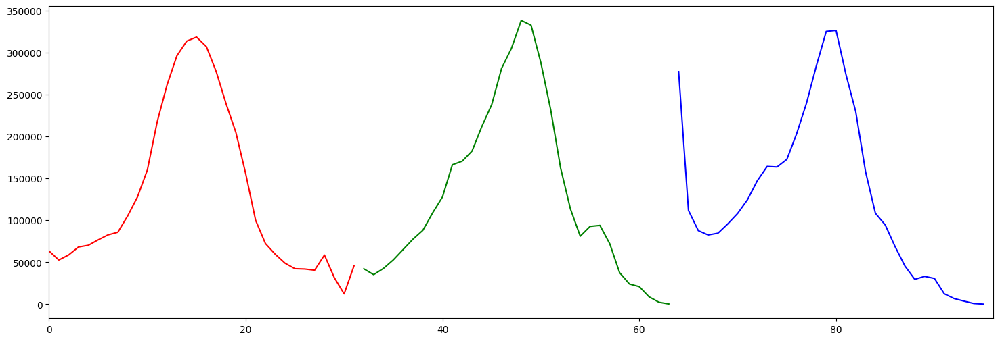

In [44]:
import matplotlib.pyplot as plt

plt.figure(figsize=(18, 6))

plt.plot(list(range(32)), vec[:32], color='red')
plt.plot(list(range(32, 64)), vec[32:64], color='green')
plt.plot(list(range(64, 96)), vec[64:96], color='blue')

plt.xlim(0, 96)

plt.show()

In [45]:
image_vectors = []
for image in images:
    image_vectors.append(get_vector(image))

In [46]:
dist = np.linalg.norm(image_vectors[0] - image_vectors[1])
dist

2007400.0

In [47]:
def euclidean(a,b):
    return np.linalg.norm(a-b)
def cosine(a,b):
    return np.dot(a,b) / (np.linalg.norm(a) * np.linalg.norm(b))

In [48]:
# during visualization we use this array of RGB images
rgb_images = np.array([np.flip(image, 2) for image in images])

def search(idx, top_k=5):
    query_vector = image_vectors[idx]
    distances = []
    for _, vector in enumerate(image_vectors):
        distances.append(cosine(query_vector, vector))
    # get top k most similar images
    top_idx = np.argpartition(distances, -top_k)[-top_k:]
    return top_idx

C:\Users\arpit\AppData\Local\Temp\ipykernel_9168\3508758223.py:2: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  rgb_images = np.array([np.flip(image, 2) for image in images])


In [58]:
def visualize(query_i, results_i):
    query = rgb_images[query_i]
    span = int(len(image_vectors[0])/3)
    results = rgb_images[results_i]
    top_k = len(results)
    # visualize query image and it's color histogram
    fig, axs = plt.subplots(1,2, figsize=(18,10))
    axs[0].imshow(query)
    axs[0].axis('off')
    axs[1].plot(image_vectors[query_i][:span], 'r', label='red')
    axs[1].plot(image_vectors[query_i][span:span*2], 'g', label='green')
    axs[1].plot(image_vectors[query_i][span*2:], 'b', label='blue')
    plt.show()
    # visualize top k images and their color histograms
    fig0, axs0 = plt.subplots(1, top_k, figsize=(top_k*5, 5))
    fig1, axs1 = plt.subplots(1, top_k, figsize=(top_k*5, 5), sharey=True)
    for i in range(top_k):
        axs0[i].imshow(results[i])
        axs0[i].axis('off')
        axs1[i].plot(image_vectors[results_i[i]][:span], 'r', label='red')
        axs1[i].plot(image_vectors[results_i[i]][span:span*2], 'g', label='green')
        axs1[i].plot(image_vectors[results_i[i]][span*2:], 'b', label='blue')

In [59]:
results_i = search(0)

In [60]:
results_i

array([ 3, 18, 14, 15,  0], dtype=int64)

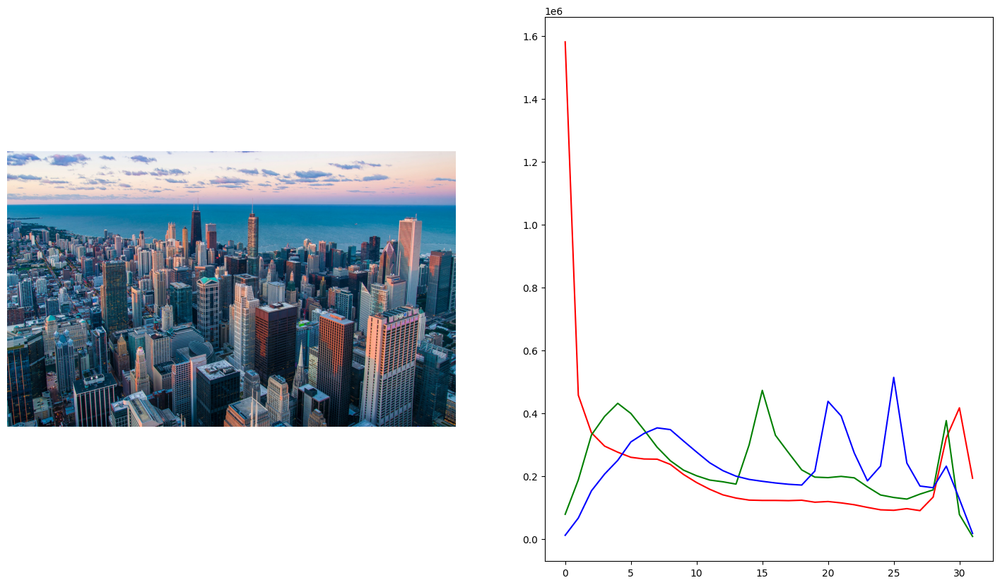

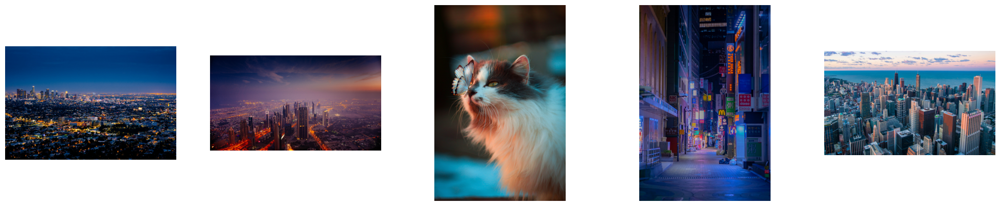

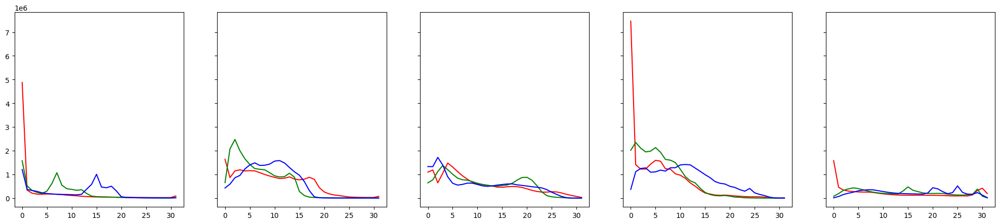

In [61]:
img = 6
visualize(img, search(img))

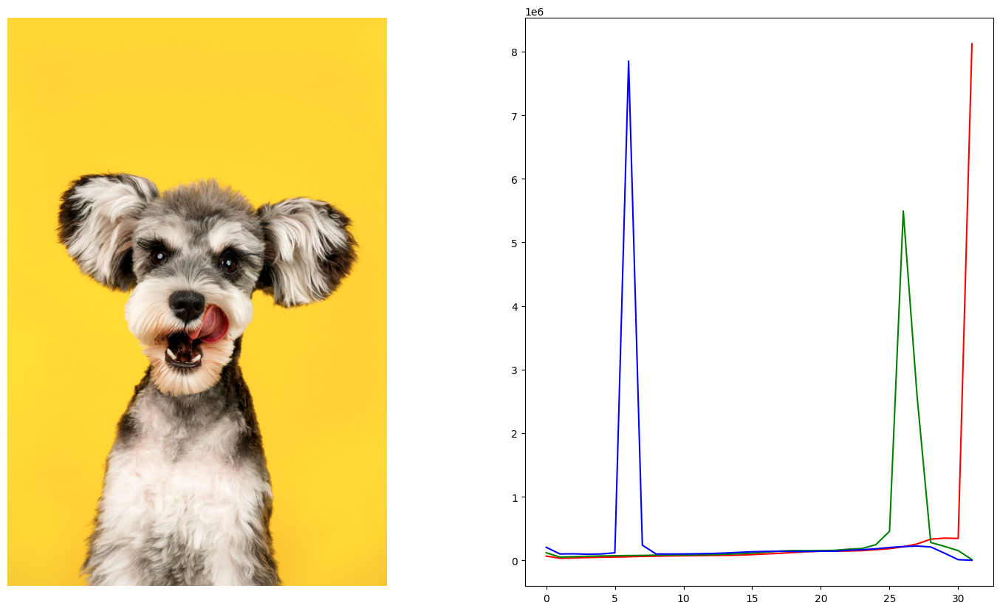

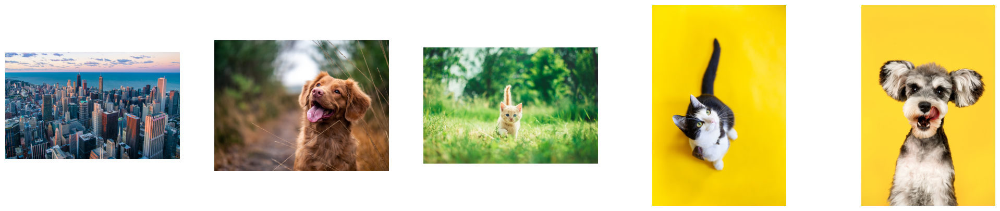

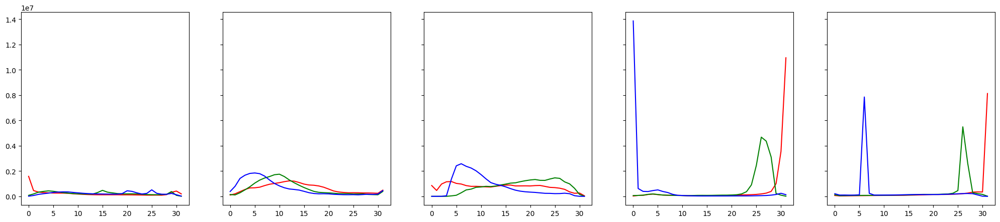

In [62]:

img = 10
visualize(img, search(img))

In [63]:
image_vectors = []
for image in images:
    image_vectors.append(get_vector(image, bins=96))

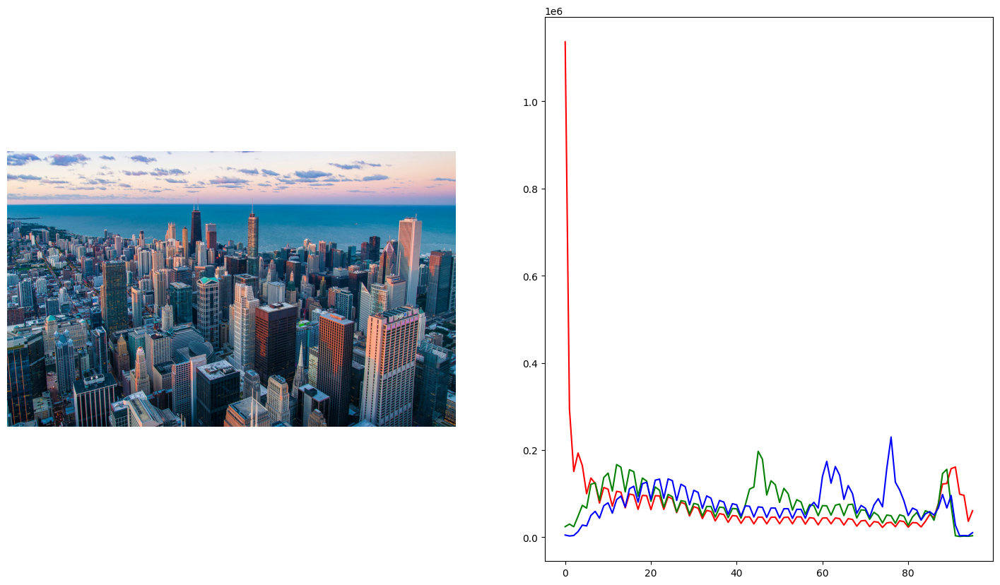

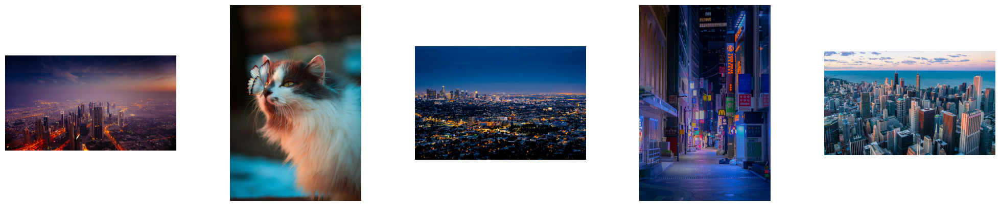

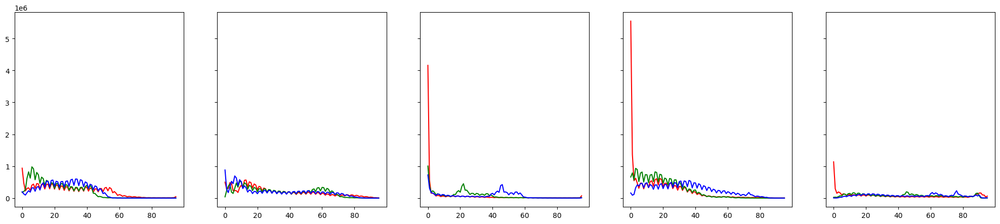

In [64]:
img = 6
visualize(img, search(img))

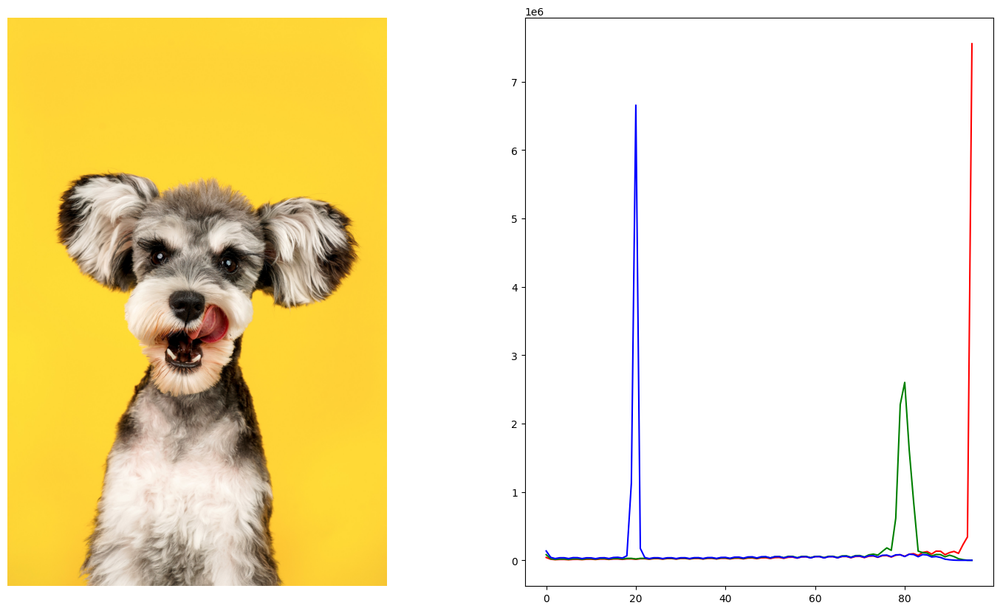

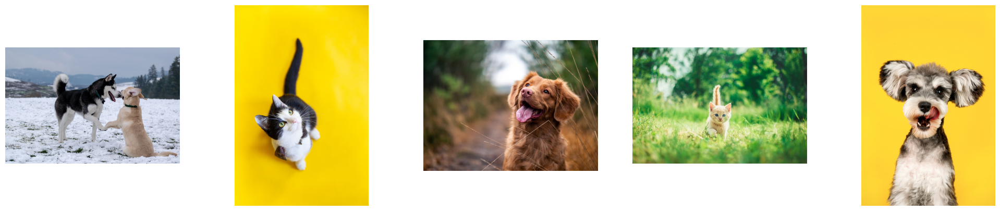

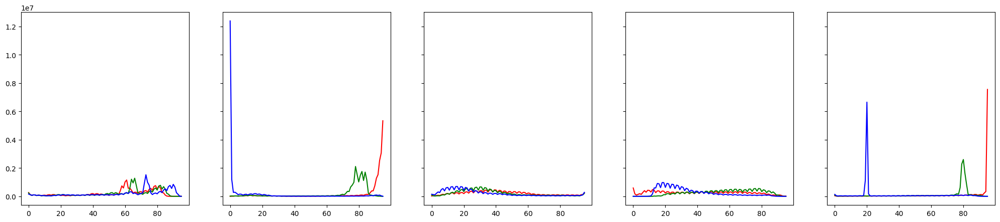

In [65]:

img = 10
visualize(img, search(img))

In [66]:
image_vectors = []
for image in images:
    image_vectors.append(get_vector(image, bins=256))

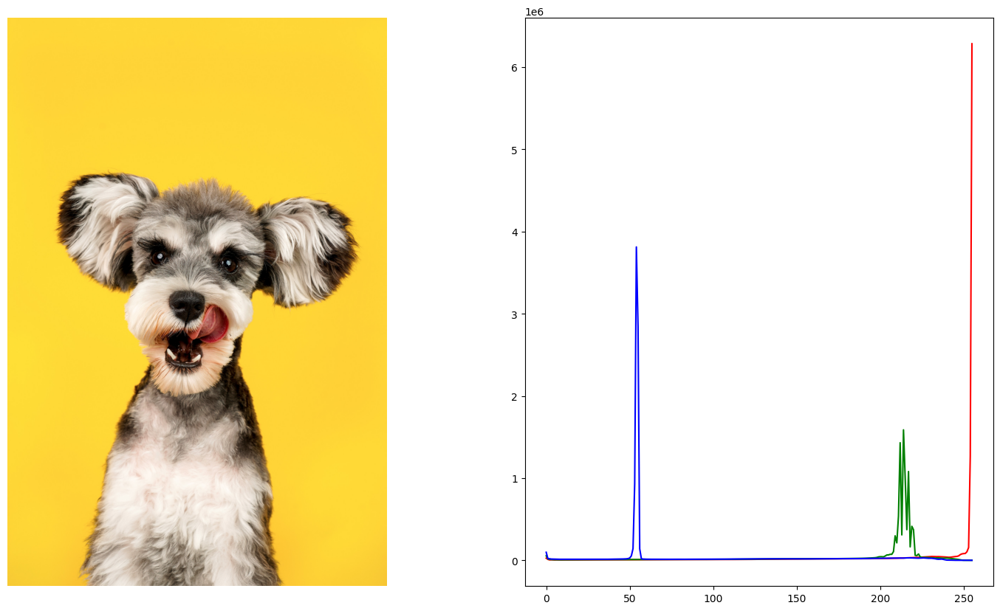

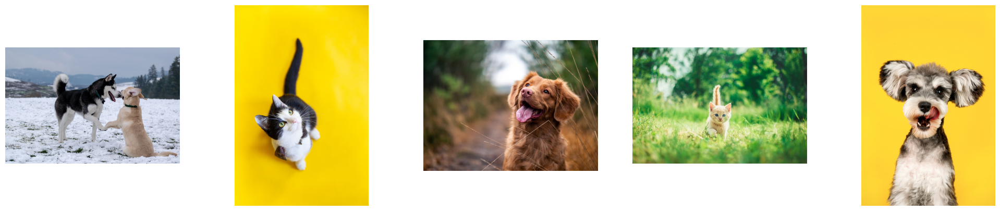

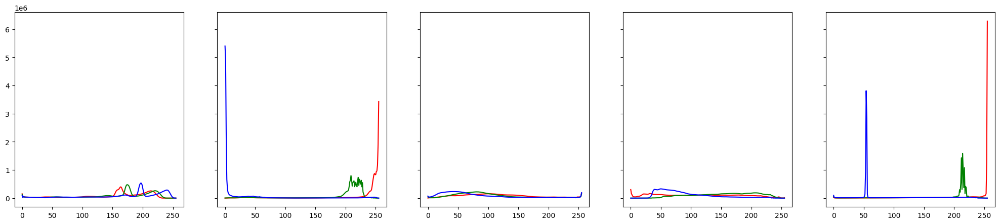

In [67]:
img = 10
visualize(img, search(img))